# Gastrulation

In [29]:
%load_ext autoreload
%load_ext autotime

import os
import sys
import glob
import pandas as pd
import math
import matplotlib.pyplot as plt

# import from absolute directory
srcdir='/Users/pengzhizhang/cellDancer/src'
sys.path.append(srcdir)
import celldancer.cdplt as cdplt
from celldancer.cdplt import colormap
from celldancer.velocity_estimation import velocity
from celldancer.compute_cell_velocity import compute
from celldancer.pseudo_time import pseudo_time
from celldancer.embedding_kinetic_para import embedding

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 24.4 ms (started: 2022-05-31 09:20:06 -05:00)


## Load detail

In [102]:
cellDancer_df_file='/Users/pengzhizhang/pseudotime/data/Gastrulation/velocity_result/combined_detail_2000_genes_with_bin_and_smooth.csv'
cellDancer_df=pd.read_csv(cellDancer_df_file)
cellDancer_df

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,cost,clusters,cellID,embedding1,embedding2
0,0,2810025M15Rik,1.515440,0.000000,1.514860,0.000022,0.001560,0.022612,0.005908,0.087183,Blood progenitors 2,cell_363,3.460521,15.574629
1,1,2810025M15Rik,1.574459,0.000000,1.573860,0.000022,0.001522,0.022650,0.005876,0.087183,Blood progenitors 2,cell_382,2.490433,14.971734
2,2,2810025M15Rik,1.744201,0.000000,1.743548,0.000020,0.001426,0.022751,0.005787,0.087183,Blood progenitors 2,cell_385,2.351203,15.267069
3,3,2810025M15Rik,1.332406,0.000000,1.331888,0.000024,0.001682,0.022495,0.006009,0.087183,Blood progenitors 2,cell_393,5.899098,14.388825
4,4,2810025M15Rik,1.261786,0.000000,1.261292,0.000025,0.001732,0.022449,0.006049,0.087183,Blood progenitors 2,cell_398,4.823139,15.374831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24657995,12324,Zrsr2,0.255452,0.030816,0.323642,0.022484,0.005919,0.101278,0.144163,0.126370,Erythroid3,cell_139318,8.032358,7.603037
24657996,12325,Zrsr2,0.204272,0.049630,0.322781,0.036203,0.008434,0.100651,0.142879,0.126370,Erythroid3,cell_139321,10.352904,6.446736
24657997,12326,Zrsr2,0.230350,0.050146,0.349145,0.036532,0.008174,0.100769,0.143180,0.126370,Erythroid3,cell_139326,9.464873,7.261099
24657998,12327,Zrsr2,0.236227,0.052799,0.361591,0.038445,0.008380,0.100769,0.143180,0.126370,Erythroid3,cell_139327,9.990495,7.243880


time: 1min (started: 2022-05-31 19:44:53 -05:00)


In [103]:
#%%script echo skipping
cellDancer_df.rename(columns={'s0':'splice', 'u0':'unsplice', 's1':'splice_predict', 'u1':'unsplice_predict'}, 
                     inplace = True)

time: 22.4 ms (started: 2022-05-31 19:46:07 -05:00)


Caution! Overwriting the 'velocity' columns.


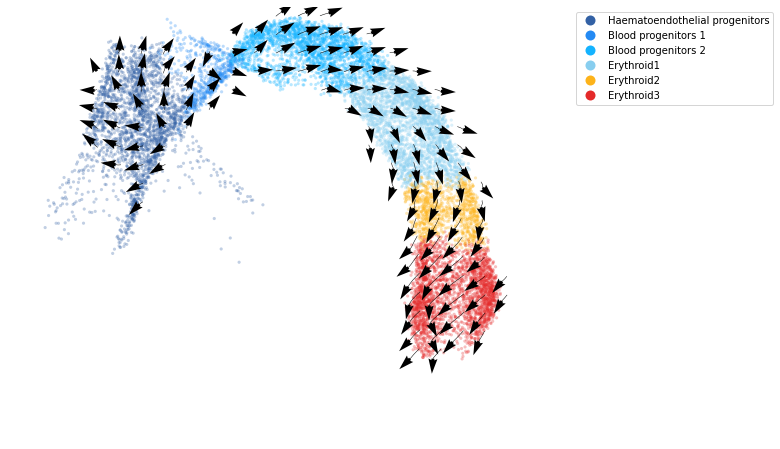

time: 1min 21s (started: 2022-06-02 15:09:16 -05:00)


In [518]:
%autoreload 2

# Set Parameters
projection_neighbor_choice='gene'
expression_scale='power10'
projection_neighbor_size=10
speed_up=(100,100)

# Compute cell velocity
cellDancer_df=compute(cellDancer_df=cellDancer_df,
              projection_neighbor_choice=projection_neighbor_choice,
              expression_scale=expression_scale,
              projection_neighbor_size=projection_neighbor_size,
              speed_up=speed_up)

# Plot cell velocity
# Set Parameters
min_mass=15
arrow_grid=(20,20)
custom_xlim=[-6,13]
custom_ylim=[2,16]

fig, ax = plt.subplots(figsize=(10,8))
im = cdplt.cell.scatter_cell(
    ax,cellDancer_df, 
    colors=colormap.colormap_erythroid, 
    alpha=alpha_inside, 
    s=10,
    velocity=True, 
    legend='on',
    min_mass=min_mass,
    arrow_grid=arrow_grid, 
    custom_xlim=custom_xlim, 
    custom_ylim=custom_ylim)
ax.axis('off')
plt.show()

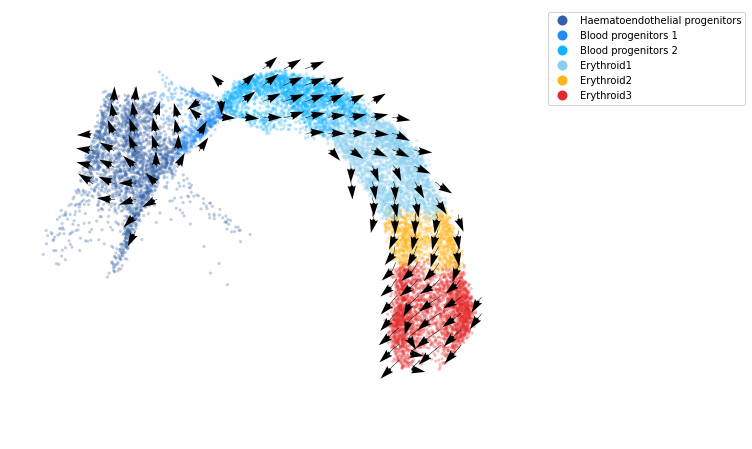

time: 3.49 s (started: 2022-06-01 09:15:59 -05:00)


In [112]:
min_mass=10
arrow_grid=(20,20)
alpha_inside=0.3
custom_xlim=[-6,13]
custom_ylim=[2,18]

fig, ax = plt.subplots(figsize=(9.5,8))
im = cdplt.cell.scatter_cell(
    ax,cellDancer_df, 
    colors=colormap.colormap_erythroid, 
    alpha=alpha_inside, 
    s=10,
    velocity=True, 
    legend='on',
    min_mass=min_mass,
    arrow_grid=arrow_grid, 
    custom_xlim=custom_xlim, 
    custom_ylim=custom_ylim)
ax.axis('off')
plt.show()

In [10]:
cellDancer_df

,cellIndex,gene_name,splice,unsplice,splice_predict,unsplice_predict,alpha,beta,gamma,cost,clusters,cellID,embedding1,embedding2,index,velocity1,velocity2
0,0,2810025M15Rik,1.515440,0.000000,1.514860,0.000022,0.001560,0.022612,0.005908,0.087183,Blood progenitors 2,cell_363,3.460521,15.574629,0,NaN,NaN
1,1,2810025M15Rik,1.574459,0.000000,1.573860,0.000022,0.001522,0.022650,0.005876,0.087183,Blood progenitors 2,cell_382,2.490433,14.971734,1,NaN,NaN
2,2,2810025M15Rik,1.744201,0.000000,1.743548,0.000020,0.001426,0.022751,0.005787,0.087183,Blood progenitors 2,cell_385,2.351203,15.267069,2,NaN,NaN
3,3,2810025M15Rik,1.332406,0.000000,1.331888,0.000024,0.001682,0.022495,0.006009,0.087183,Blood progenitors 2,cell_393,5.899098,14.388825,3,NaN,NaN
4,4,2810025M15Rik,1.261786,0.000000,1.261292,0.000025,0.001732,0.022449,0.006049,0.087183,Blood progenitors 2,cell_398,4.823139,15.374831,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24657995,12324,Zrsr2,0.255452,0.030816,0.323642,0.022484,0.005919,0.101278,0.144163,0.126370,Erythroid3,cell_139318,8.032358,7.603037,12324,-0.13259,-0.589345
24657996,12325,Zrsr2,0.204272,0.049630,0.322781,0.036203,0.008434,0.100651,0.142879,0.126370,Erythroid3,cell_139321,10.352904,6.446736,12325,NaN,NaN
24657997,12326,Zrsr2,0.230350,0.050146,0.349145,0.036532,0.008174,0.100769,0.143180,0.126370,Erythroid3,cell_139326,9.464873,7.261099,12326,NaN,NaN
24657998,12327,Zrsr2,0.236227,0.052799,0.361591,0.038445,0.008380,0.100769,0.143180,0.126370,Erythroid3,cell_139327,9.990495,7.243880,12327,NaN,NaN


time: 19.6 ms (started: 2022-05-27 17:22:54 -05:00)


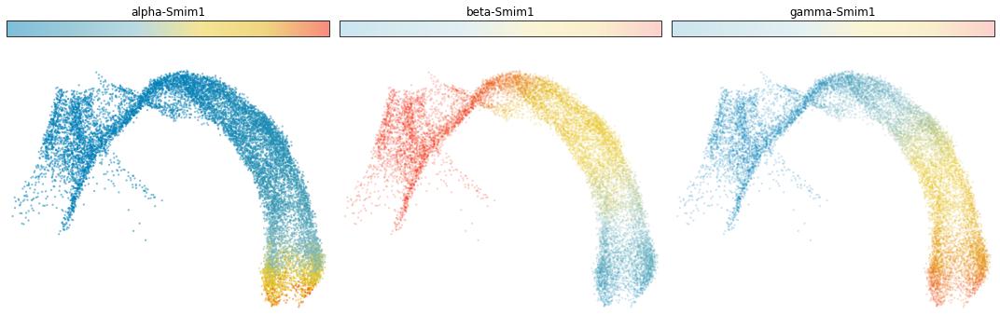

time: 5.9 s (started: 2022-05-05 09:34:06 -05:00)


In [17]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5))
gene = 'Smim1'
im0=cdplt.cell.scatter_cell(ax[0],load_cellDancer, colors='alpha', 
             gene_name=gene, velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18))
im1=cdplt.cell.scatter_cell(ax[1],load_cellDancer, colors='beta', 
             gene_name=gene, velocity=False, alpha=0.2, custom_xlim=(-5,11), custom_ylim=(4,18))
im2=cdplt.cell.scatter_cell(ax[2],load_cellDancer, colors='gamma', 
             gene_name=gene, velocity=False, alpha=0.2, custom_xlim=(-5,11), custom_ylim=(4,18))
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].set_title('alpha-'+gene)
ax[1].set_title('beta-'+gene)
ax[2].set_title('gamma-'+gene)
plt.tight_layout()
plt.show()

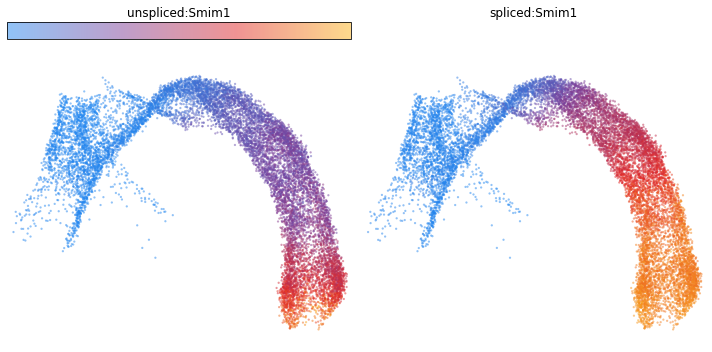

time: 3.95 s (started: 2022-05-05 09:33:10 -05:00)


In [15]:
%autoreload 2

fig, ax = plt.subplots(ncols=2, figsize=(10,5))
gene = 'Smim1'
im0=cdplt.cell.scatter_cell(ax[0],load_cellDancer, colors='unspliced', 
             gene_name=gene, velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18), colorbar='on')
im1=cdplt.cell.scatter_cell(ax[1],load_cellDancer, colors='spliced', 
             gene_name=gene, velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18), colorbar='off')

ax[0].axis('off')
ax[1].axis('off')
ax[0].set_title('unspliced:'+gene)
ax[1].set_title('spliced:'+gene)
plt.tight_layout()
plt.show()

## Estimate pseudotime

Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9510/9510 [00:11<00:00, 855.69it/s]


use path_similarity:  0.25
There are 3 clusters.
[0 1 2]


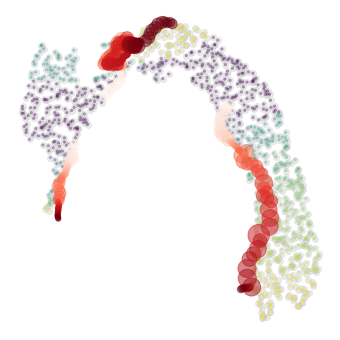




Cluster  0
Total cells in the cluster:  593
MAX allowed zero time cells:  29
MAX allowed terminal cells:  29
154  zero cells left.
Sample trajs for zero-time cells in cluster  0   ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



Cluster  0
Total cells in the cluster:  154
MAX allowed zero time cells:  29
MAX allowed terminal cells:  29
Only  3  zero cells left. 
[574, 710, 738]
Only  3  terminal cells left.
[223, 266, 299]
74  terminal cells left.
Sample trajs for terminal cells in cluster  0  ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



Cluster  0
Total cells in the cluster:  74
MAX allowed zero time cells:  29
MAX allowed terminal cells:  29
Only  6  zero cells left. 
[334, 612, 846, 892, 942, 944]
Only  12  terminal cells left.
[311, 328, 332, 605, 610, 638, 652, 807, 851, 882, 886, 893]
number of paths:  3
number of subclusters:  3

Display reference paths for cluster 0


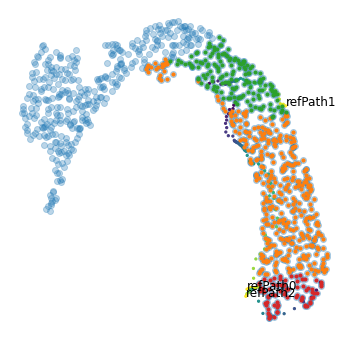


intercluster cell time adjustment
number of cells:  593
Cutoff is  0.049023098769299306
Number of nodes:  3
clusterIDs:  [0, 1, 2]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (149, 140)
pair_cellIDs:  (708, 266)
pair_cellIDs:  (778, 861)
pair_cellIDs:  (726, 256)
pair_cellIDs:  (596, 758)
pair_cellIDs:  (179, 463)
pair_cellIDs:  (288, 573)
pair_cellIDs:  (702, 223)
pair_cellIDs:  (768, 260)
pair_cellIDs:  (514, 299)
pair_cellIDs:  (278, 207)
pair_cellIDs:  (131, 435)
pair_cellIDs:  (742, 101)
pair_cellIDs:  (796, 723)
pair_cellIDs:  (753, 676)
pair_cellIDs:  (111, 91)
pair_cellIDs:  (721, 82)
pair_cellIDs:  (150, 273)
pair_cellIDs:  (174, 582)
pair_cellIDs:  (304, 440)
pair_cellIDs:  (222, 167)
pair_cellIDs:  (725, 289)

Peak mode:  most_frequent_shift


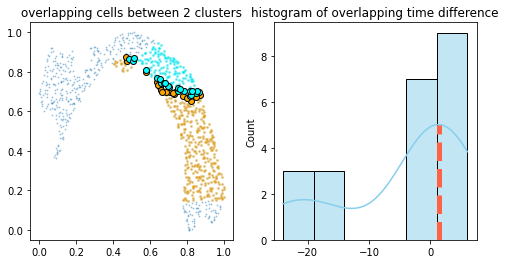

Time shift is:  2
The overlapping cells are: 
cell  778  from cluster  0  and  861  from cluster  1

Consolidating time between clusters  0  and  2 ...
pair_cellIDs:  (912, 609)
pair_cellIDs:  (870, 893)
pair_cellIDs:  (922, 851)
pair_cellIDs:  (860, 882)
pair_cellIDs:  (853, 942)
pair_cellIDs:  (934, 892)
pair_cellIDs:  (902, 862)
pair_cellIDs:  (625, 652)
pair_cellIDs:  (833, 638)
pair_cellIDs:  (639, 612)
pair_cellIDs:  (654, 614)
pair_cellIDs:  (836, 846)
pair_cellIDs:  (838, 874)
pair_cellIDs:  (329, 334)
pair_cellIDs:  (622, 605)
pair_cellIDs:  (884, 807)

Peak mode:  most_frequent_shift


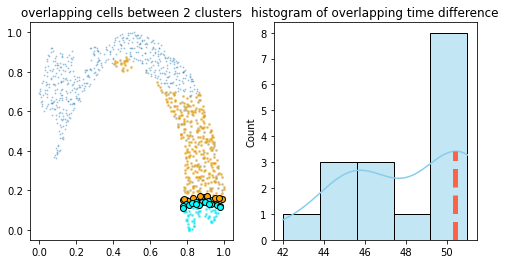

Time shift is:  50
The overlapping cells are: 
cell  912  from cluster  0  and  609  from cluster  2

Consolidating time between clusters  1  and  2 ...
No close cells between clusters	 (1, 2)


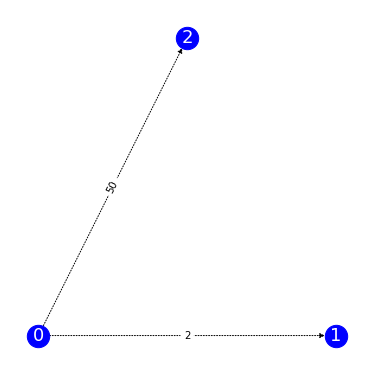

Connected components:  {0, 1, 2}
All nodes adjustment:  {0: 0, 1: 2, 2: 50}



Cluster  1
Total cells in the cluster:  247
MAX allowed zero time cells:  12
MAX allowed terminal cells:  12
68  zero cells left.
Sample trajs for zero-time cells in cluster  1   ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



Cluster  1
Total cells in the cluster:  68
MAX allowed zero time cells:  12
MAX allowed terminal cells:  12
Only  1  zero cells left. 
[539]
Only  4  terminal cells left.
[130, 474, 583, 794]
36  terminal cells left.
Sample trajs for terminal cells in cluster  1  ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



Cluster  1
Total cells in the cluster:  36
MAX allowed zero time cells:  12
MAX allowed terminal cells:  12
Only  2  zero cells left. 
[77, 372]
Only  1  terminal cells left.
[44]
number of paths:  3
number of subclusters:  3

Display reference paths for cluster 1


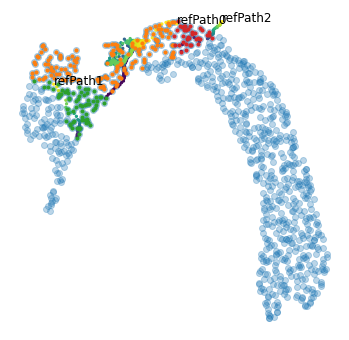


intercluster cell time adjustment
number of cells:  247
Cutoff is  0.03250456537672204
Number of nodes:  3
clusterIDs:  [0, 1, 2]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (607, 474)
pair_cellIDs:  (271, 488)
pair_cellIDs:  (85, 794)
pair_cellIDs:  (754, 237)
pair_cellIDs:  (550, 11)
pair_cellIDs:  (309, 130)
pair_cellIDs:  (186, 378)
pair_cellIDs:  (568, 548)

Peak mode:  most_frequent_shift


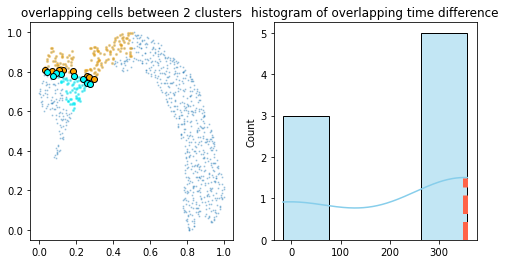

Time shift is:  353
The overlapping cells are: 
cell  607  from cluster  0  and  474  from cluster  1

Consolidating time between clusters  0  and  2 ...
pair_cellIDs:  (682, 700)
pair_cellIDs:  (368, 36)
pair_cellIDs:  (52, 108)
pair_cellIDs:  (71, 30)
pair_cellIDs:  (675, 77)
pair_cellIDs:  (218, 405)
pair_cellIDs:  (370, 258)

Peak mode:  most_frequent_shift


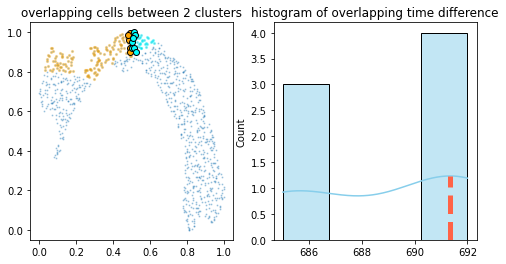

Time shift is:  691
The overlapping cells are: 
cell  218  from cluster  0  and  405  from cluster  2

Consolidating time between clusters  1  and  2 ...
No close cells between clusters	 (1, 2)


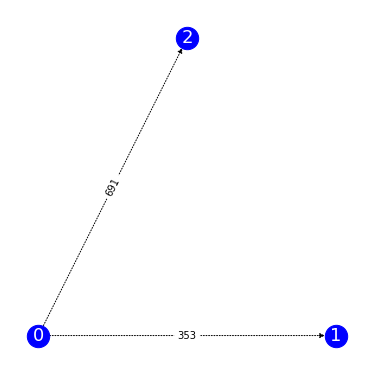

Connected components:  {0, 1, 2}
All nodes adjustment:  {0: 0, 1: 353, 2: 691}



Cluster  2
Total cells in the cluster:  111
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  1  terminal cells left.
[660]
68  zero cells left.
Sample trajs for zero-time cells in cluster  2   ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



Cluster  2
Total cells in the cluster:  68
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  6  zero cells left. 
[16, 110, 129, 546, 566, 686]
11  terminal cells left.
Sample trajs for terminal cells in cluster  2  ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



Cluster  2
Total cells in the cluster:  11
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  1  zero cells left. 
[339]
Only  2  terminal cells left.
[415, 571]
number of paths:  3
number of subclusters:  3

Display reference paths for cluster 2


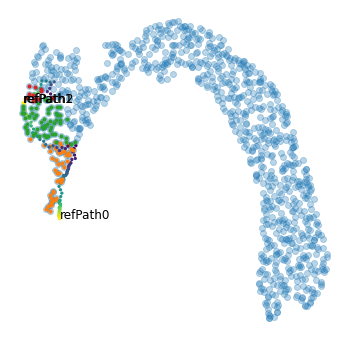


intercluster cell time adjustment
number of cells:  111
Cutoff is  0.020690388863973397
Number of nodes:  3
clusterIDs:  [0, 1, 2]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (737, 123)
pair_cellIDs:  (390, 546)
pair_cellIDs:  (579, 422)
pair_cellIDs:  (300, 188)

Peak mode:  least_shift


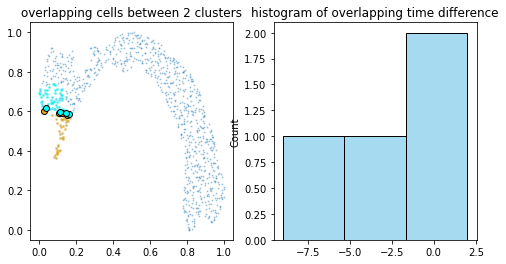

Time shift is:  1
The overlapping cells are: 
cell  300  from cluster  0  and  188  from cluster  1

Consolidating time between clusters  0  and  2 ...
No close cells between clusters	 (0, 2)

Consolidating time between clusters  1  and  2 ...
pair_cellIDs:  (217, 789)
pair_cellIDs:  (705, 339)

Peak mode:  least_shift


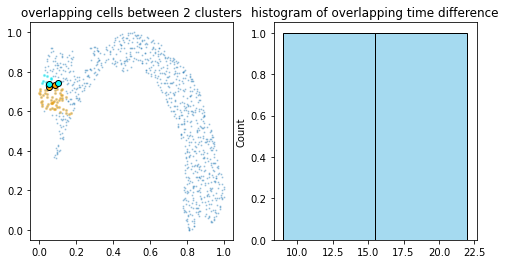

Time shift is:  9
The overlapping cells are: 
cell  217  from cluster  1  and  789  from cluster  2


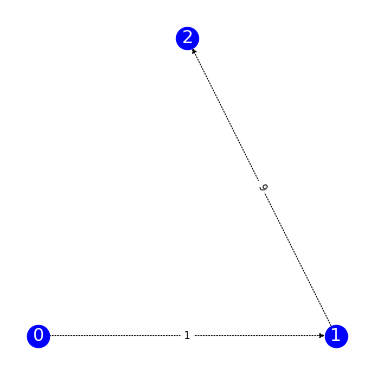

Connected components:  {0, 1, 2}
All nodes adjustment:  {0: 0, 1: 1, 2: 10}



All intra cluster cell time has been resolved.




intercluster cell time adjustment
number of cells:  951
Cutoff is  0.06265744445123025
Number of nodes:  3
clusterIDs:  [0, 1, 2]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (256, 239)
pair_cellIDs:  (336, 616)
pair_cellIDs:  (252, 127)
pair_cellIDs:  (440, 800)
pair_cellIDs:  (304, 96)
pair_cellIDs:  (133, 693)
pair_cellIDs:  (56, 372)
pair_cellIDs:  (797, 180)
pair_cellIDs:  (26, 113)
pair_cellIDs:  (798, 774)
pair_cellIDs:  (726, 128)
pair_cellIDs:  (735, 77)
pair_cellIDs:  (671, 136)
pair_cellIDs:  (57, 86)
pair_cellIDs:  (793, 121)
pair_cellIDs:  (773, 724)
pair_cellIDs:  (685, 675)
pair_cellIDs:  (60, 367)
pair_cellIDs:  (45, 44)
pair_cellIDs:  (305, 670)
pair_cellIDs:  (587, 398)
pair_cellIDs:  (240, 364)
pair_cellIDs:  (162, 703)

Peak mode:  most_frequent_shift


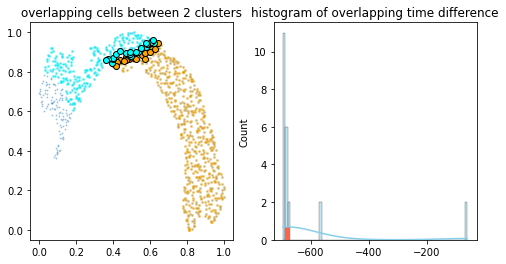

Time shift is:  -682
The overlapping cells are: 
cell  587  from cluster  0  and  398  from cluster  1

Consolidating time between clusters  0  and  2 ...
No close cells between clusters	 (0, 2)

Consolidating time between clusters  1  and  2 ...
pair_cellIDs:  (79, 16)
pair_cellIDs:  (130, 89)
pair_cellIDs:  (539, 566)
pair_cellIDs:  (915, 339)
pair_cellIDs:  (474, 909)
pair_cellIDs:  (733, 792)
pair_cellIDs:  (583, 769)
pair_cellIDs:  (607, 330)
pair_cellIDs:  (84, 941)
pair_cellIDs:  (561, 686)
pair_cellIDs:  (406, 110)
pair_cellIDs:  (125, 705)
pair_cellIDs:  (661, 129)
pair_cellIDs:  (492, 116)
pair_cellIDs:  (185, 546)
pair_cellIDs:  (750, 25)
pair_cellIDs:  (357, 713)
pair_cellIDs:  (538, 790)
pair_cellIDs:  (567, 5)
pair_cellIDs:  (557, 188)
pair_cellIDs:  (203, 487)
pair_cellIDs:  (6, 718)

Peak mode:  most_frequent_shift


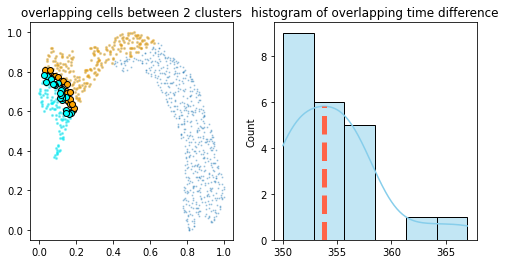

Time shift is:  354
The overlapping cells are: 
cell  583  from cluster  1  and  769  from cluster  2


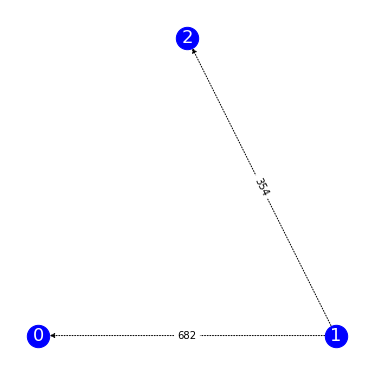

Connected components:  {0, 1, 2}
All nodes adjustment:  {0: 0, 1: -682, 2: -328}


All inter cluster cell time has been resolved.



There are 12329 cells.


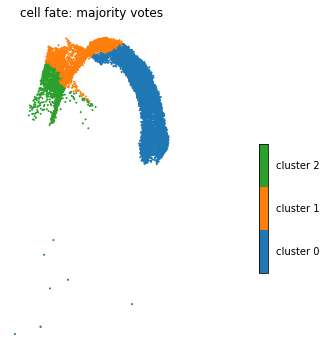

--- 86.74817895889282 seconds ---
time: 1min 27s (started: 2022-06-02 09:18:18 -05:00)


In [333]:
%autoreload 2

cell_time = dict()
dt = 0.1
#t_total = {dt:int(10/dt)} 
t_total = {0.1: 1000}
n_repeats = 10

grid = (10, 10)

load_cellDancer = pseudo_time(
    cellDancer_df=cellDancer_df, 
    grid=grid, 
    dt=dt, 
    t_total=t_total[dt], 
    n_repeats=n_repeats, 
    speed_up=speed_up,
    n_paths = 3,
    psrng_seeds_diffusion=[i for i in range(n_repeats)],
    activate_umap_paths_divider=False,
    n_jobs=-2)

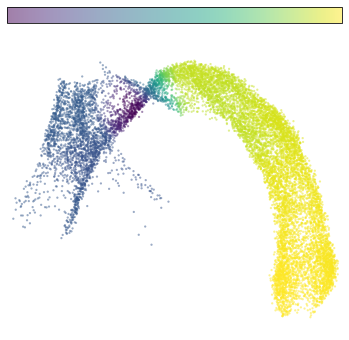

time: 7.34 s (started: 2022-06-02 09:21:52 -05:00)


In [334]:
fig, ax = plt.subplots(figsize=(6,6))
clusters = load_cellDancer['clusters'].drop_duplicates().to_list()
im=cdplt.cell.scatter_cell(ax,load_cellDancer, colors='pseudotime', alpha=0.5, 
             velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18))
ax.axis('off')
plt.show()

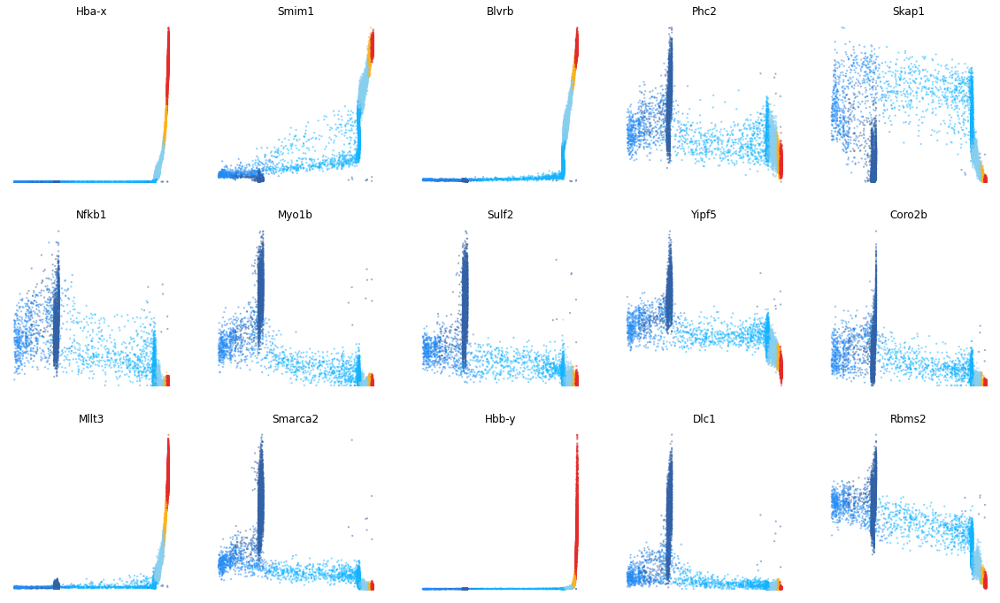

time: 35.5 s (started: 2022-06-02 09:22:23 -05:00)


In [335]:
# Show legend only
#_, ax = plt.subplots()
#cdplt.gene.scatter_gene(ax=ax,legend='only', colors=colormap.colormap_erythroid, s = 10, gene_name=None)
#ax.axis('off')
#plt.show()
gene_list=['Hba-x','Smim1','Blvrb','Phc2','Skap1',
           'Nfkb1','Myo1b','Sulf2','Yipf5','Coro2b',
           'Mllt3','Smarca2', 'Hbb-y','Dlc1','Rbms2']

import math
ncols=5
fig = plt.figure(figsize=(4*ncols,4*len(gene_list)/ncols))


for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='pseudotime',
        y='splice',
        cellDancer_df=cellDancer_df,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=False,
        gene=gene_list[i])

    ax.set_title(gene_list[i])
    ax.axis('off')

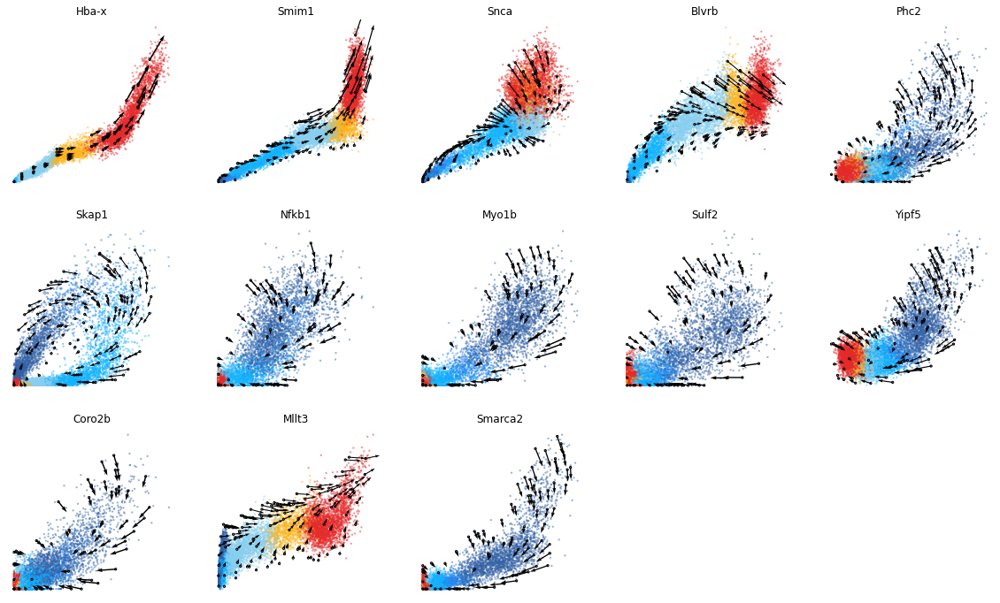

time: 39.9 s (started: 2022-05-05 16:19:47 -05:00)


In [33]:
ncols=5
fig = plt.figure(figsize=(4*ncols,4*len(gene_list)/ncols))


for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='splice',
        y='unsplice',
        load_cellDancer=load_cellDancer,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene=gene_list[i])
    
    ax.set_title(gene_list[i])
    ax.axis('off')

plt.show()


## Graph representation of the cell fates


In [ ]:
%autoreload 2
from celldancer.plotting import graph
graph = graph.graph(load_cellDancer, node_layout='embedding', edge_length='2', use_edge_bundling=False,
                    node_colors='clusters', save_path='.')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
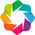

time: 116 ms (started: 2022-06-02 12:29:41 -05:00)


In [403]:
import networkx as nx
from datashader.layout import forceatlas2_layout
import holoviews as hv
from holoviews import opts
from holoviews.operation.datashader import datashade, bundle_graph
from holoviews.element.graphs import layout_nodes
hv.extension('bokeh')
#hv.extension('matplotlib')


def create_nodes_edges(data, radius):
    def create_KNN_based_graph():
        from sklearn.neighbors import NearestNeighbors
        neigh = NearestNeighbors(radius = radius)
        neigh.fit(embedding_ds)
        nn_graph = neigh.radius_neighbors_graph(embedding_ds, mode='connectivity')
        nn_array = nn_graph.toarray()

        # nn_array is effectively the edge list
        # Keep track of cells of 0 timeshift.
        node_list = [(i, {'pseudotime': pseudotime_ds[i,0], 'clusters':clusters_ds[i]})
                     for i in range(len(embedding_ds))]

        dtime = pseudotime_ds[:,0] - pseudotime_ds
        INF = 1./np.min(np.abs(dtime[dtime != 0]))

        # upper triangle of the knn array (i<j and nn_array[i,j] = 1)
        edge_filter = np.triu(nn_array, k=1)
        (i,j) = np.where(edge_filter != 0)

        # for forcedirected layouts,
        # edge length is positively correlated with weight.
        # hence 1/dtime here as the weight
        # Created for directed graph
        edge_list = list()
        for a,b,w in zip(i,j, dtime[i,j]):
            if w>0:
                edge_list.append((a, b, 1/w))
            elif w<0:
                edge_list.append((a, b, -1/w))
            else:
                edge_list.append((a, b, INF))

        G = nx.Graph()
        G.add_nodes_from(node_list)
        G.add_weighted_edges_from(edge_list)
        return G

    embedding = extract_from_df(data, ['embedding1', 'embedding2'])
    n_cells = embedding.shape[0]
    sample_cells = data['velocity1'][:n_cells].dropna().index
    clusters = extract_from_df(data, ['clusters'])
    pseudotime = extract_from_df(data, ['pseudotime'])

    embedding_ds = embedding[sample_cells]
    pseudotime_ds = pseudotime[sample_cells]
    clusters_ds = clusters[sample_cells]

    G = create_KNN_based_graph()

    index = np.array(range(len(embedding_ds)), dtype=int)[:,None]
    nodes = pd.DataFrame(np.hstack((embedding_ds, index, pseudotime_ds, clusters_ds)),
                         columns=['x','y','index','pseudotime','clusters'])

    edges = pd.DataFrame([(i[0], i[1], G.edges[i]['weight']) for i in G.edges],
                         columns=['source', 'target', 'weight'])
    return nodes, edges

In [ ]:
graph = hv.Graph((edges, nodes))
if node_layout in ['forceatlas2', 'forcedirected']:
    layout_graph = layout_nodes(
            graph,
            layout=forceatlas2_layout,
            kwargs={'k':0.01,
                    'x':'x',
                    'y':'y',
                    'weight':'weight',
                    'iterations':1000,
                    'seed':0})
elif node_layout in ['embedding']:
    layout_graph = graph
else:
    layout_graph = graph

if use_edge_bundling:
    bundled = bundle_graph(layout_graph)
else:
    bundled = layout_graph

if node_colors in ['clusters']:
    cmap = colormap.colormap_neuro

elif node_colors in ['pseudotime']:
    cmap = 'viridis'
elif node_colors is None:
    cmap = None


In [610]:
node_layout='forcedirected'
edge_length= 2
use_edge_bundling=True
node_colors='clusters'
node_size=5

nodes, edges = create_nodes_edges(load_cellDancer, edge_length)


time: 3.4 s (started: 2022-06-02 16:04:22 -05:00)


In [619]:
forcedirected = forceatlas2_layout(nodes[['index']], edges, weight='weight', iterations=1000, seed=10)

time: 3min 50s (started: 2022-06-02 17:51:22 -05:00)


In [613]:
bundle = hammer_bundle(forcedirected, edges)

time: 1min 26s (started: 2022-06-02 16:06:10 -05:00)


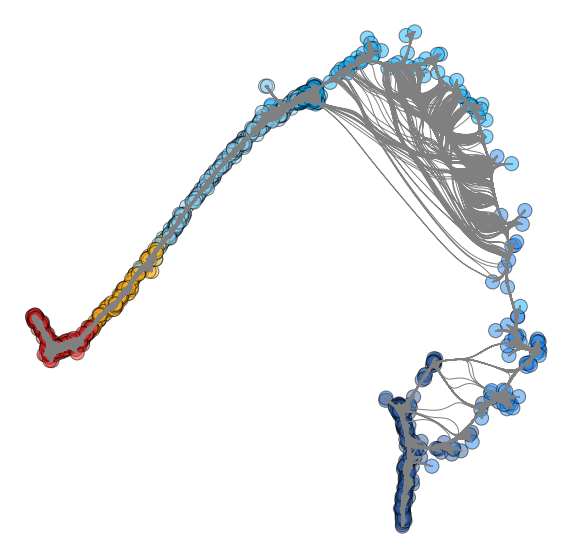

time: 2.1 s (started: 2022-06-02 17:41:48 -05:00)


In [618]:
from datashader.bundling import hammer_bundle
pos = forcedirected
color = np.vectorize(colormap.colormap_erythroid.get)(nodes['clusters'])
cmap = ListedColormap(colormap.colormap_erythroid.values())
hb = bundle


fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(hb.x, hb.y, 'y', zorder=2, linewidth=1, color='gray')
ax.scatter(pos.x, pos.y, c=color, cmap=cmap, s=200, zorder=1, edgecolors='k', alpha=0.5)
ax.axis('off')
plt.show()